# Laboratorio 2: Análisis exploratorio en un problema de clasificación

## Utilizaremos en esta práctica las siguientes librerías

[numpy](http://www.numpy.org/) permite manipular matrices de modo sencillo e incorpora funciones de cálculo útiles.  
[pandas](http://pandas.pydata.org/) proporciona estructuras de datos fáciles de usar y funciones de acceso a datos desde múltiples fuentes y formatos.  
[matplotlib](matplotlib.org) permite generar múltiples tipos de gráficos.  
[re](https://docs.python.org/2/library/re.html#) permite manipular expresiones regulares.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pandas.plotting import parallel_coordinates
import matplotlib.patches as mpatches
import re
%matplotlib inline


In [2]:
import brewer2mpl
from matplotlib import rcParams

#colorbrewer2 Dark2 qualitative color table
dark2_cmap = brewer2mpl.get_map('Dark2', 'Qualitative', 7)
dark2_colors = dark2_cmap.mpl_colors

rcParams['figure.figsize'] = (10, 6)
rcParams['figure.dpi'] = 150
rcParams['lines.linewidth'] = 2
rcParams['axes.facecolor'] = 'white'
rcParams['font.size'] = 14
rcParams['patch.edgecolor'] = 'white'
rcParams['patch.facecolor'] = dark2_colors[0]
rcParams['font.family'] = 'StixGeneral'

# Para eliminar bordes en gráficas
def elimina_borde(axes=None, top=False, right=False, left=True, bottom=True):
    ax = axes or plt.gca()
    ax.spines['top'].set_visible(top)
    ax.spines['right'].set_visible(right)
    ax.spines['left'].set_visible(left)
    ax.spines['bottom'].set_visible(bottom)

    # Eliminar marcas
    ax.yaxis.set_ticks_position('none')
    ax.xaxis.set_ticks_position('none')

    # Rehabilitar visibles
    if top:
        ax.xaxis.tick_top()
    if bottom:
        ax.xaxis.tick_bottom()
    if left:
        ax.yaxis.tick_left()
    if right:
        ax.yaxis.tick_right()


In [3]:
pd.set_option('display.width', 500)
pd.set_option('display.max_columns', 100)


## 0. Clasificación de aceites de oliva italianos

El punto de partida es una colección de datos extraídos de un conjunto de diferentes aceites de oliva. Cada muestra de aceite se representa mediante ocho parámetros, que se corresponden con los niveles de distintos ácidos grasos en cada aceite. Cada muestra de aceite pertenece a una de entre nueve variedades de aceite de oliva, de tres regiones y ocho áreas geográficas distintas de Italia. El objetivo del análisis es desarrollar un conjunto de reglas de clasificación que permitan distinguir de modo fiable los nueve aceites. Este es un problema de interés práctico, porque el aceite de algunas de las zonas está muy bien valorado, y existe cierto nivel de fraude en la denominación de origen. Además, el contenido en ácidos grasos varía con el clima, lo que resulta relevante para decidir qué variedades se han de plantar en según qué zonas. 

**Fuente:**

Forina, M., Armanino, C., Lanteri, S. & Tiscornia, E. (1983), Classification of Olive Oils from their Fatty Acid Composition, in Martens, H. and
Russwurm Jr., H., eds, Food Research and Data Analysis, Applied Science
Publishers, London, pp. 189–214.

Número de muestras: 572

Número de variables: 10

*Descripción:* los datos representan el porcentaje (x100) de ácidos grasos en la fracción lipídica de un conjunto de muestras de aceites de oliva procedentes de Italia. Los datos proceden de un estudio cuyo objetivo es la determinación de la autenticidad de la denominación de origen en el aceite de oliva.

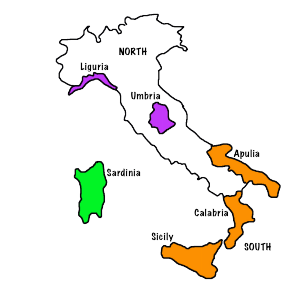

In [4]:
from IPython.display import Image
Image(filename="images/italy.png")


## 1. Cargamos y limpiamos los datos

Cargamos los datos desde el fichero oliva.csv mediante las librerías pandas y visualizamos al menos las 5 primeras filas de datos. Como el fichero está en formato csv buscamos la existencia de alguna función en pandas de nombre `read_csv()`.

In [5]:
# Almacenamos los datos del fichero en el objeto 'datos', de tipo Dataframe
datos = pd.read_csv(filepath_or_buffer="data/oliva.csv", header=0)

# Visualizamos las primeras 5 filas de datos gracias a la función `head()`
print(datos.head(5))


      Unnamed: 0  región  área  palmítico  palmitoleico  esteárico  oleico  linoleico  linolénico  araquídico  eicosenoico
0  1.Puglia-Nord       1     1       1075            75        226    7823        672          36          60           29
1  2.Puglia-Nord       1     1       1088            73        224    7709        781          31          61           29
2  3.Puglia-Nord       1     1        911            54        246    8113        549          31          63           29
3  4.Puglia-Nord       1     1        966            57        240    7952        619          50          78           35
4  5.Puglia-Nord       1     1       1051            67        259    7771        672          50          80           46


Pondremos nombre a la primera columna, que carece de él. Para ello podemos consultar la existencia de alguna función en pandas de nombre `rename()`.

In [6]:
# Imprimimos en primer lugar los títulos de las columnas, que se encuentran en datos.columns
print(datos.columns)

# Cambiamos columns[0] por 'procedencia'
datos = datos.rename(columns={datos.columns[0]: 'procedencia'})

# Imprimimos de nuevo los datos de las primeras 5 filas
print(datos.head(5))


Index(['Unnamed: 0', 'región', 'área', 'palmítico', 'palmitoleico', 'esteárico', 'oleico', 'linoleico', 'linolénico', 'araquídico', 'eicosenoico'], dtype='object')
     procedencia  región  área  palmítico  palmitoleico  esteárico  oleico  linoleico  linolénico  araquídico  eicosenoico
0  1.Puglia-Nord       1     1       1075            75        226    7823        672          36          60           29
1  2.Puglia-Nord       1     1       1088            73        224    7709        781          31          61           29
2  3.Puglia-Nord       1     1        911            54        246    8113        549          31          63           29
3  4.Puglia-Nord       1     1        966            57        240    7952        619          50          78           35
4  5.Puglia-Nord       1     1       1051            67        259    7771        672          50          80           46


Queremos acceder a la subtabla formada por las columnas `oleico` y `linoleico`.

In [7]:
# Usamos la función `loc` de pandas para acceder a la subtabla deseada
subtabla1 = datos.loc[:, ['oleico', 'linoleico']]

# Imprimimos
print("Subtabla formada por las columnas oleico y linoleico:")
print(subtabla1)


Subtabla formada por las columnas oleico y linoleico:
     oleico  linoleico
0      7823        672
1      7709        781
2      8113        549
3      7952        619
4      7771        672
..      ...        ...
567    7490        790
568    7740        810
569    7720        970
570    7750        870
571    7950        740

[572 rows x 2 columns]


El resultado es un nuevo objeto, del tipo `DataFrame` de pandas. Queremos ahora acceder a una sola de las columnas, por ejemplo, la del ácido esteárico.

In [8]:
# Accedemos a la columna del 'ácido esteárico'
subtabla2 = datos.loc[:, 'esteárico']

# Imprimimos
print("Columna del ácido esteárico:")
print(subtabla2)


Columna del ácido esteárico:
0      226
1      224
2      246
3      240
4      259
      ... 
567    290
568    270
569    210
570    250
571    240
Name: esteárico, Length: 572, dtype: int64


El objeto obtenido es un objeto del tipo `Series` de pandas. Si utilizamos dos corchetes para indexar a partir de una lista obtendremos un objeto de tipo Dataframe. Analizaremos los tipos de ambos ejemplos mediante la función `type()`.

In [9]:
print("Tipo de datos[['esteárico']]:\t", type(datos[['esteárico']]))
print("Tipo de datos['esteárico']:\t", type(datos['esteárico']))


Tipo de datos[['esteárico']]:	 <class 'pandas.core.frame.DataFrame'>
Tipo de datos['esteárico']:	 <class 'pandas.core.series.Series'>


Si los nombres no tienen acentos podemos acceder a cada columna de una manera más sencilla, por ejemplo, mediante `datos.estearico`.

Volvemos a nuestra tabla de datos. Eliminaremos el número que acompaña a cada región de procedencia, ya que se extrajo del fichero junto con el nombre porque ambos aparecen separados por un punto. Para ello podemos utilizar tanto la función `split()` como la función `sub()` de la librería `re` de expresiones regulares, junto con la función `map()` para realizar el cambio con cada uno de los elementos de la columna de procedencia.

In [10]:
# Utilizamos una asignación del tipo datos['procedencia'] = datos['procedencia'].map()
datos['procedencia'] = datos['procedencia'].map(
    lambda dato: re.split('\.', dato)[1])


Resulta un poco confusa la existencia de una columna región y otra área, además de la que nombra la procedencia. Consultaremos qué valores distintos hay en ambas columnas. En este caso es sencillo porque el conjunto de datos no es muy extenso, pero utilizaremos la función `unique()` para hacer este análisis extensivo a cualquier conjunto de datos verdaderamente grande.

In [11]:
# Consultamos los valores distintos en la columna de 'región'
region_unique = pd.unique(datos['región'])
print(f'Datos únicos en la columna \'región\': {region_unique}')

# Consultamos los valores distintos en la columna de 'área'
area_unique = pd.unique(datos['área'])
print(f'Datos únicos en la columna \'área\': {area_unique}')

# Consultamos los valores distintos en la columna de 'procedencia'
area_unique = pd.unique(datos['procedencia'])
print(f'Datos únicos en la columna \'procedencia\': {area_unique}')


Datos únicos en la columna 'región': [1 2 3]
Datos únicos en la columna 'área': [1 2 3 4 5 6 9 7 8]
Datos únicos en la columna 'procedencia': ['Puglia-Nord' 'Calabria' 'Puglia-Sud' 'Sicilia' 'Sardinia-Interno'
 'Sardinia-Costa' 'Umbria' 'Liguria-Est' 'Liguria-Ovest']


Necesitamos saber cuántas zonas únicas hay en el conjunto de datos, ya que a ellas asignaremos cada etiqueta de clase. Para ello podemos realizar una tabla de contingencia entre las etiquetas de regiones y las etiquetas de áreas. En python podemos hacer esto mediante la función `crosstab()`.

In [12]:
# Obtenemos la tabla de contingencia entre las etiquetas de 'región' y de 'áreas'
zones = pd.crosstab(datos['región'], datos['área'],
                    margins=True, margins_name="Total")

# Imprimimos el resultado
print("Zonas únicas:")
print(zones)


Zonas únicas:
área     1   2    3   4   5   6   7   8   9  Total
región                                            
1       25  56  206  36   0   0   0   0   0    323
2        0   0    0   0  65  33   0   0   0     98
3        0   0    0   0   0   0  50  50  51    151
Total   25  56  206  36  65  33  50  50  51    572


**Contestación:**

Como podemos ver en el resultado anterior existen 9 zonas únicas en el conjunto de datos. Estas 9 zonas únicas coinciden además con el número de valores única para la columna de 'procedencia' obtenida en en un apartado anterior. Por lo tanto, estas áreas representan las 9 procedencias distintas que hay en nuestro conjunto de datos. Cada una de estas áreas pertenece a alguna de las 3 regiones. Como se puede arriba, las áreas 1, 2 y 3 pertenecen a la región 1; las áreas 4 y 5 a la región 2; y las áreas 7, 8 y 9 pertenecen a la región 3.

Generamos el conjunto de valores diferentes de la columna procedencia mediante la función `unique()`

In [13]:
# Obtenemos los datos únicos en la columna de 'procedencia'
procedencia_unique = pd.unique(datos['procedencia'])
print(f'Datos únicos en la columna \'procedencia\': {procedencia_unique}')

# Obtenemos el número de datos únicos
print(
    f"Número de datos únicos en la columna de \'procedencia\': {procedencia_unique.size}")


Datos únicos en la columna 'procedencia': ['Puglia-Nord' 'Calabria' 'Puglia-Sud' 'Sicilia' 'Sardinia-Interno'
 'Sardinia-Costa' 'Umbria' 'Liguria-Est' 'Liguria-Ovest']
Número de datos únicos en la columna de 'procedencia': 9


Recuperaremos los valores originales (en tanto por ciento) de la proporción de cada ácido graso en cada muestra de aceite, porque después su representación gráfica será más fácilmente comprensible. Para ello actuamos sobre las columnas que representan las proporciones de los ácidos grasos. Podemos utilizar la función `apply()` para dividir todos los valores entre 100.

In [14]:
# Definimos una lista con los nombres de los distintos ácidos
acidos_names = ["palmítico", "palmitoleico", "esteárico",
                "oleico", "linoleico", "linolénico", "araquídico", "eicosenoico"]

# Accedemos a cada uno de los valores de cada una de las columnas y lo dividimos entre 100 mediante apply()
datos_percentage = datos.loc[:, acidos_names].apply(lambda x: x/100)

# Imprimimos los 5 primeros resultados para comprobar
print(datos_percentage.head(5))


   palmítico  palmitoleico  esteárico  oleico  linoleico  linolénico  araquídico  eicosenoico
0      10.75          0.75       2.26   78.23       6.72        0.36        0.60         0.29
1      10.88          0.73       2.24   77.09       7.81        0.31        0.61         0.29
2       9.11          0.54       2.46   81.13       5.49        0.31        0.63         0.29
3       9.66          0.57       2.40   79.52       6.19        0.50        0.78         0.35
4      10.51          0.67       2.59   77.71       6.72        0.50        0.80         0.46


Podemos comprobar que la composición de ácidos grasos es consistente, es decir, que la suma de las proporciones de los ácidos grasos para cada muestra se mantiene próximo al 100%.

In [15]:
# Calculamos la suma de las proporciones de los ácidos grasos para cada muestra
datos_percentage["suma"] = datos_percentage.loc[:, acidos_names].sum(axis=1)

# Imprimimos los 5 primeros resultados para comprobar
print(datos_percentage.head(5))


   palmítico  palmitoleico  esteárico  oleico  linoleico  linolénico  araquídico  eicosenoico   suma
0      10.75          0.75       2.26   78.23       6.72        0.36        0.60         0.29  99.96
1      10.88          0.73       2.24   77.09       7.81        0.31        0.61         0.29  99.96
2       9.11          0.54       2.46   81.13       5.49        0.31        0.63         0.29  99.96
3       9.66          0.57       2.40   79.52       6.19        0.50        0.78         0.35  99.97
4      10.51          0.67       2.59   77.71       6.72        0.50        0.80         0.46  99.96


Representamos mediante gráficos de dispersión los datos correspondientes a la presencia de ácido palmítico y ácido palmitoleico en el total de las muestras. Las librerías pyplot utilizan la noción de figura actual y ejes actuales. Para realizar esta figura podemos hacer uso de la función `scatter()`. También podemos utilizar las funciones `set_title()`, `set_xlabel()` y `set_ylabel()` para añadir rótulos a la figura a partir del objeto que representa los ejes, que podemos extraer mediante la función `gca()`.

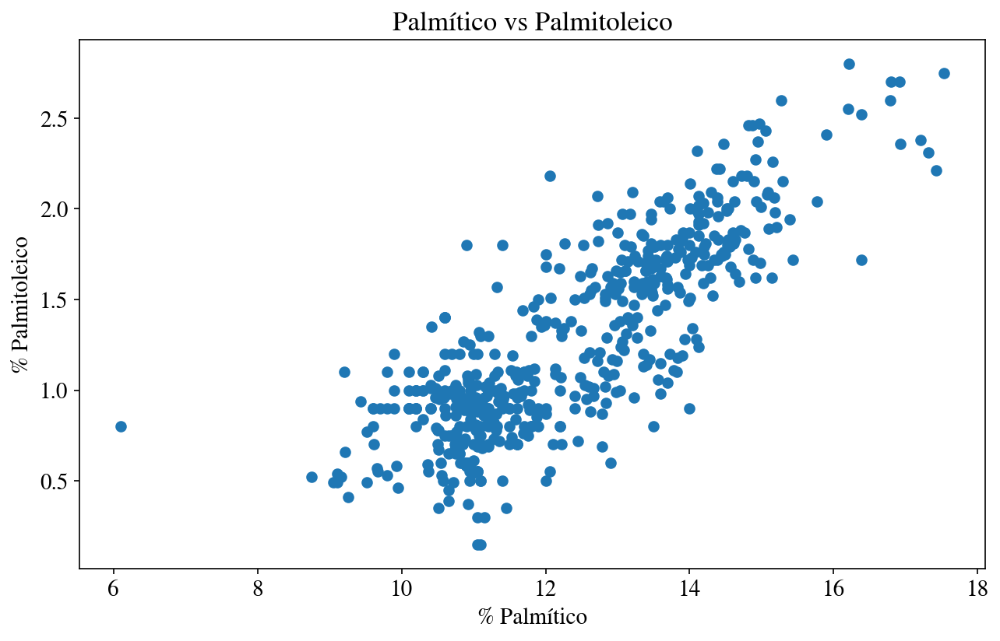

In [16]:
# Definimos la figura actual
fig = plt.figure()

# Definimos los ejes actuales
axis = fig.gca()

# Introducimos título de la figura y de los ejes a partir del objeto axis
axis.set_title('Palmítico vs Palmitoleico')
axis.set_xlabel('% Palmítico')
axis.set_ylabel('% Palmitoleico')

# Representamos los datos mediante la función `scatter()`
plt.scatter(datos_percentage["palmítico"], datos_percentage["palmitoleico"])


Representamos gráficamente el histograma de la presencia de ácido palmitoleico en el conjunto de muestras. Hacemos uso para ello de la función `hist()`.

(array([  9.,  53., 132., 120.,  44.,  90.,  75.,  29.,  13.,   7.]),
 array([0.15 , 0.415, 0.68 , 0.945, 1.21 , 1.475, 1.74 , 2.005, 2.27 ,
        2.535, 2.8  ]),
 <BarContainer object of 10 artists>)

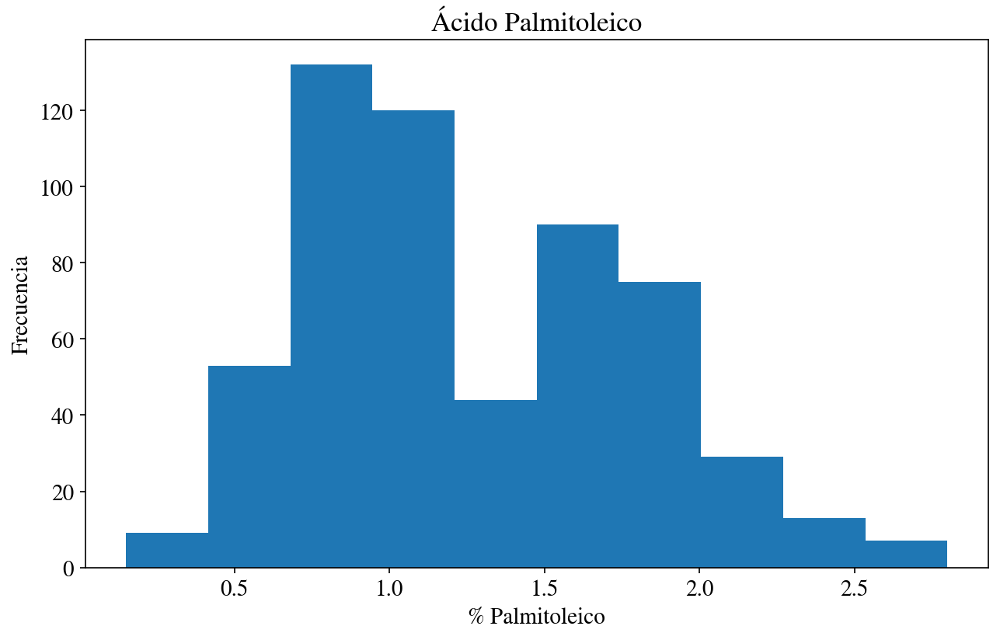

In [17]:
# Definimos la figura actual
fig = plt.figure()

# Definimos los ejes actuales
axis = fig.gca()

# Introducimos título de la figura y de los ejes a partir del objeto axis
axis.set_title('Ácido Palmitoleico')
axis.set_xlabel('% Palmitoleico')
axis.set_ylabel('Frecuencia')

axis.hist(datos_percentage["palmitoleico"])


Utilizaremos la función `subplots()` para representar cuatro figuras en una matriz de dos por dos.

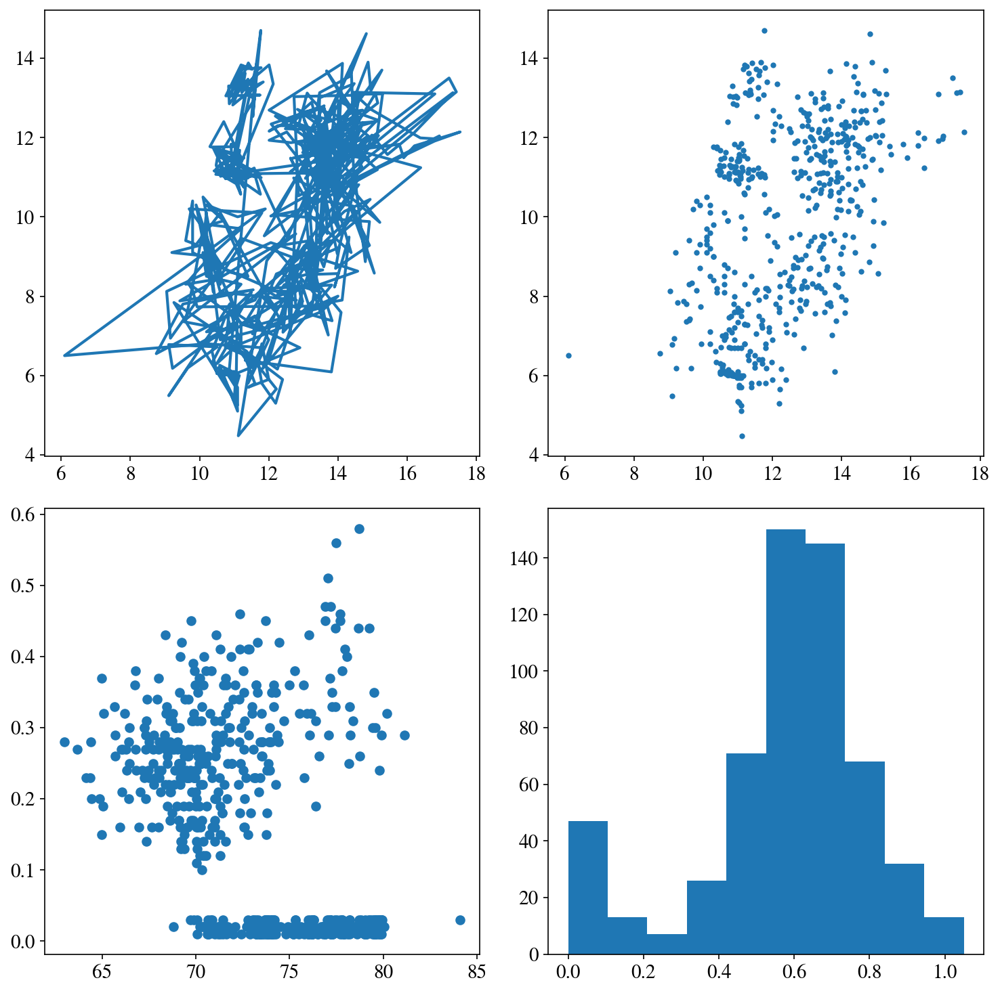

In [18]:
fig, axes = plt.subplots(figsize=(10, 10), nrows=2, ncols=2)
axes[0][0].plot(datos_percentage['palmítico'], datos_percentage['linoleico'])
axes[0][1].plot(datos_percentage['palmítico'],
                datos_percentage['linoleico'], '.')
axes[1][0].scatter(datos_percentage['oleico'], datos_percentage['eicosenoico'])
axes[1][1].hist(datos_percentage['araquídico'])
fig.tight_layout()


Representaremos mediante gráficos de dispersión los ácidos grasos de la lista `acidos_y` frente a los de la lista `acidos_x`. Podemos dibujar los ácidos grasos de la lista `acidos_y` en el eje 'y' y los ácidos grasos de la lista `acidos_x` en el eje 'x'. La representación se hará mediante una matriz de figuras de 3 filas y 2 columnas. Etiquetar convenientemente cada figura. Para no contar el número de elementos en las listas, podemos utilizar la función `enumerate()`.

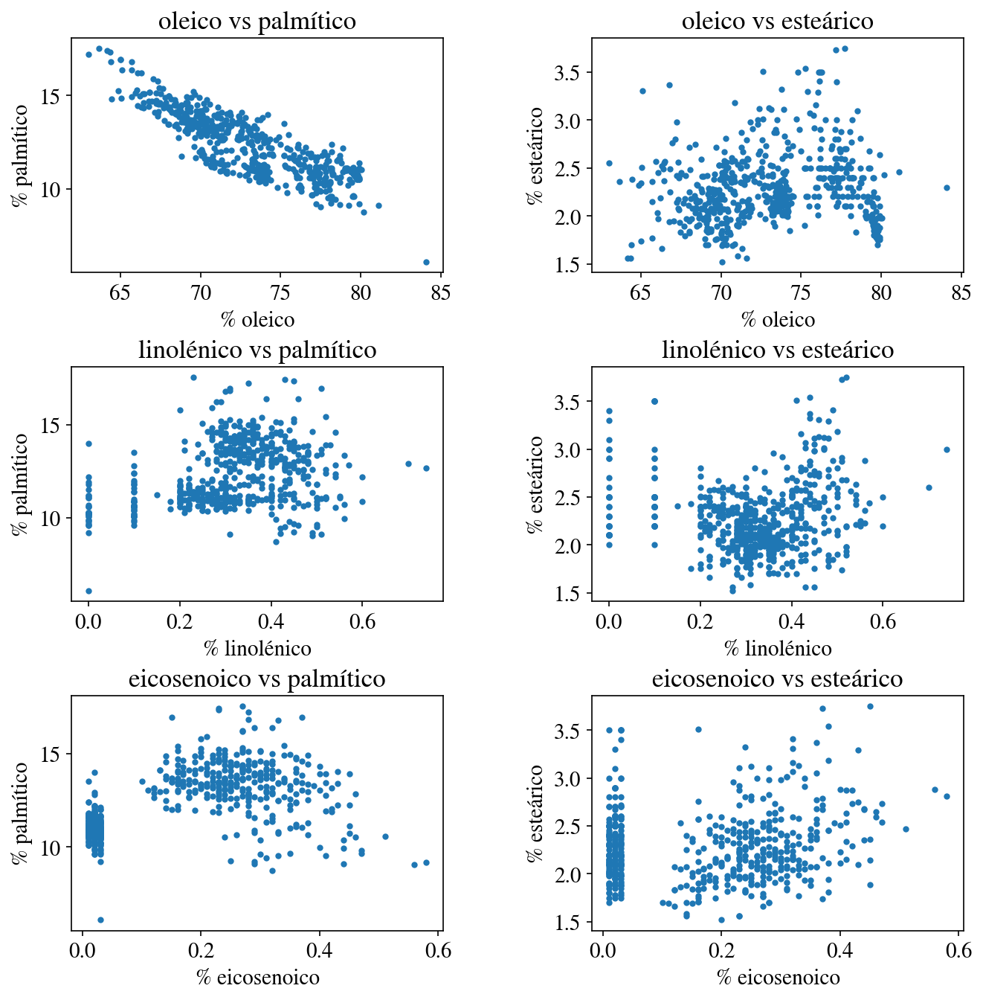

In [19]:
acidos_x = ['oleico', 'linolénico', 'eicosenoico']
acidos_y = ['palmítico', 'esteárico']

# Primero definimos los subplots
fig, axes = plt.subplots(figsize=(10, 10), nrows=3, ncols=2)

# Establecemos el espaciamiento entre cada plot
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

# Utilizaremos dos bucles recorriendo la lista de acidos_x y acidos_y
for i, acido_x in enumerate(acidos_x):
    for j, acido_y in enumerate(acidos_y):
        # Representamos la figura
        axes[i][j].plot(datos_percentage[acido_x],
                        datos_percentage[acido_y], '.')

        # Etiquetamos correctamente
        axes[i][j].set_title(f'{acido_x} vs {acido_y}')
        axes[i][j].set_xlabel(f'% {acido_x}')
        axes[i][j].set_ylabel(f'% {acido_y}')


Utilizaremos la función `groupby()` para realizar distintos agrupamientos de los valores de la tabla. En primer lugar, agruparemos por el valor la columna `región`, que nos permitirá dividir el conjunto de datos en tres subconjuntos.

In [20]:
# Añadimos la fila región a los datos (en tanto porciento)
datos_percentage['región'] = datos['región']

# Eliminamos la columna suma
datos_percentage = datos_percentage.drop(columns=['suma'])

# Agrupamos por región
region = datos_percentage.groupby('región', as_index=True)

print(f"El objeto resultante es de tipo: {type(region)}")
print("La primera fila de cada región:")
print(region.first())


El objeto resultante es de tipo: <class 'pandas.core.groupby.generic.DataFrameGroupBy'>
La primera fila de cada región:
        palmítico  palmitoleico  esteárico  oleico  linoleico  linolénico  araquídico  eicosenoico
región                                                                                            
1           10.75          0.75       2.26   78.23       6.72        0.36        0.60         0.29
2           11.29          1.20       2.22   72.72      11.12        0.43        0.98         0.02
3           10.85          0.70       1.80   79.55       6.05        0.20        0.50         0.01


La función `groupby()` proporciona un objeto de tipo diccionario, donde las claves son los valores que permiten el agrupamiento, y los grupos direccionados por las claves son los correspondientes subconjuntos de la matriz inicial. Podemos direccionar los tres subconjuntos correspondientes a las tres regiones iterando mediante un bucle.

In [21]:
for key, value in region:
    print(
        f"La región es: {key} y su correspondiente subconjunto de la matriz inicial: {type(value)}")


La región es: 1 y su correspondiente subconjunto de la matriz inicial: <class 'pandas.core.frame.DataFrame'>
La región es: 2 y su correspondiente subconjunto de la matriz inicial: <class 'pandas.core.frame.DataFrame'>
La región es: 3 y su correspondiente subconjunto de la matriz inicial: <class 'pandas.core.frame.DataFrame'>


Como vemos, la función `groupby()` no solo realiza un agrupamiento visual, sino que identifica cada uno de los grupos como objetos en sí mismos del tipo `DataFrame`, sobre los que podemos operar. Por ejemplo, podemos utilizar la función `describe()` para analizar cada una de las regiones de un modo inmediato.

In [22]:
for key, value in region:
    print(f"Región {key}:")
    print(value.describe())


Región 1:
        palmítico  palmitoleico   esteárico      oleico   linoleico  linolénico  araquídico  eicosenoico  región
count  323.000000    323.000000  323.000000  323.000000  323.000000  323.000000  323.000000   323.000000   323.0
mean    13.322879      1.548019    2.287740   71.000093   10.334985    0.380650    0.631176     0.273220     1.0
std      1.529349      0.507237    0.398709    3.451431    2.106730    0.079727    0.111644     0.083915     0.0
min      8.750000      0.350000    1.520000   63.000000    4.480000    0.200000    0.320000     0.100000     1.0
25%     12.680000      1.215000    2.015000   68.830000    8.555000    0.320000    0.560000     0.220000     1.0
50%     13.460000      1.630000    2.230000   70.300000   10.900000    0.370000    0.620000     0.270000     1.0
75%     14.190000      1.850000    2.495000   72.835000   12.025000    0.440000    0.690000     0.320000     1.0
max     17.530000      2.800000    3.750000   81.130000   14.620000    0.740000    1.0

Un ejemplo de lo que podemos hacer es iterar sobre el conjunto de series de valores para cada columna en cada región, y calcular la desviación estándar mediante la función `std()`. Observa el tipo del resultado como conjunto de desviaciones estándar para cada columna.

In [23]:
for key, value in region:
    print(f"Región {key}:")
    print(value.std())


Región 1:
palmítico       1.529349
palmitoleico    0.507237
esteárico       0.398709
oleico          3.451431
linoleico       2.106730
linolénico      0.079727
araquídico      0.111644
eicosenoico     0.083915
región          0.000000
dtype: float64
Región 2:
palmítico       4.041106e-01
palmitoleico    1.385143e-01
esteárico       1.763627e-01
oleico          1.418783e+00
linoleico       1.072336e+00
linolénico      5.384374e-02
araquídico      1.188261e-01
eicosenoico     7.435818e-03
región          2.231862e-16
dtype: float64
Región 3:
palmítico       0.825635
palmitoleico    0.264388
esteárico       0.389560
oleico          1.648155
linoleico       1.431226
linolénico      0.168865
araquídico      0.293586
eicosenoico     0.007298
región          0.000000
dtype: float64


Además, pandas permite reunir los resultados de ejecutar `std()` en un nuevo objeto del tipo `DataFrame`. Y lo hace él todo. Podemos simplemente aplicar la función `std()` sobre el resultado del agrupamiento realizado mediante `groupby()`.

In [24]:
datos_percentage_std = region.std()

print("El resultado de aplicar la función `std()` sobre el resultado del agrupamiento realizado mediante `groupby()`: ")
print(datos_percentage_std.head())


El resultado de aplicar la función `std()` sobre el resultado del agrupamiento realizado mediante `groupby()`: 
        palmítico  palmitoleico  esteárico    oleico  linoleico  linolénico  araquídico  eicosenoico
región                                                                                              
1        1.529349      0.507237   0.398709  3.451431   2.106730    0.079727    0.111644     0.083915
2        0.404111      0.138514   0.176363  1.418783   1.072336    0.053844    0.118826     0.007436
3        0.825635      0.264388   0.389560  1.648155   1.431226    0.168865    0.293586     0.007298


Podemos utilizar la función `agreggate()` para aplicar distintas funciones de cálculo a los datos del nuevo objeto, por ejemplo `np.sum()` `np.mean()`. La aplicación de estas funciones se realiza columna a columna. 

In [25]:
datos_percentage_mean = region.aggregate(np.mean)

print("Resultado de calcular la media `np.mean` columna a columna:")
print(datos_percentage_mean.head())


Resultado de calcular la media `np.mean` columna a columna:
        palmítico  palmitoleico  esteárico     oleico  linoleico  linolénico  araquídico  eicosenoico
región                                                                                               
1       13.322879      1.548019   2.287740  71.000093  10.334985    0.380650    0.631176     0.273220
2       11.113469      0.967449   2.261837  72.680204  11.965306    0.270918    0.731735     0.019388
3       10.948013      0.837351   2.308013  77.930530   7.270331    0.217881    0.375762     0.019735


In [26]:
# ¿Qué estamos haciendo?
print(region.aggregate(lambda x: x.oleico.mean()))


        palmítico  palmitoleico  esteárico     oleico  linoleico  linolénico  araquídico  eicosenoico
región                                                                                               
1       71.000093     71.000093  71.000093  71.000093  71.000093   71.000093   71.000093    71.000093
2       72.680204     72.680204  72.680204  72.680204  72.680204   72.680204   72.680204    72.680204
3       77.930530     77.930530  77.930530  77.930530  77.930530   77.930530   77.930530    77.930530


**Contestación:**

En la celda superior lo que se está haciendo es substituir la serie de datos para cada tipo de ácido en cada uno de los tres grupos correspondientes a cada una de las tres regiones presentes en el conjunto de datos por el resultado de calcular la media (mediante la función `mean()`) de los valores del ácido oleico para cada una de las muestras provenientes de esa región.

En resumen, la función `aggregate()` opera para cada una de las regiones, columna a columna, cambiando los datos de esa columna por la media de los valores del ácido oleico para esa región.

También podemos utilizar la función `apply()` para aplicar una función determinada al nuevo objeto. Por ejemplo, podemos volver a realizar la media sobre los valores de las columnas de cada una de las regiones. Aunque pueden coincidir en algunos resultados, la función `apply()` opera sobre cada grupo, mientras que `aggregate()` opera sobre cada una de las columnas.

In [27]:
print("Resultado de aplicar la función `apply()` al objeto `region`: ")
print(region.apply(np.mean))


Resultado de aplicar la función `apply()` al objeto `region`: 
        palmítico  palmitoleico  esteárico     oleico  linoleico  linolénico  araquídico  eicosenoico  región
región                                                                                                       
1       13.322879      1.548019   2.287740  71.000093  10.334985    0.380650    0.631176     0.273220     1.0
2       11.113469      0.967449   2.261837  72.680204  11.965306    0.270918    0.731735     0.019388     2.0
3       10.948013      0.837351   2.308013  77.930530   7.270331    0.217881    0.375762     0.019735     3.0


Renombraremos las columnas de la tabla datos_std para añadir después de cada nombre la extensión '`_std`'. Para ello podemos iterar sobre todas las cadenas de `acidos`, añadiendo la subcadena `_std` después de cada cadena. Esto se puede hacer mediante una sencilla estructura diccionario en la que hacemos corresponder a cada cadena de ácidos una nueva cadena en la que añadimos '`_std`'. La función a utilizar es `rename()` donde haremos `inplace = True` para hacer la sustitución sobre la misma estructura de datos, y no sobre una copia.

In [28]:
datos_percentage_std.rename(
    columns=lambda x: x + "_std" if x in acidos_names else x, inplace=True)

# Imprimimos la tabla datos_std con los nombres de las columnas cambiados
print("Columnas renombradas:")
print(datos_percentage_std.head())


Columnas renombradas:
        palmítico_std  palmitoleico_std  esteárico_std  oleico_std  linoleico_std  linolénico_std  araquídico_std  eicosenoico_std
región                                                                                                                            
1            1.529349          0.507237       0.398709    3.451431       2.106730        0.079727        0.111644         0.083915
2            0.404111          0.138514       0.176363    1.418783       1.072336        0.053844        0.118826         0.007436
3            0.825635          0.264388       0.389560    1.648155       1.431226        0.168865        0.293586         0.007298


Haremos una sencilla operación de unión entre tablas para disponer de una nueva tabla en la que representamos la media y la desviación estándar para el ácido oleico en cada una de las tres regiones. Para ello extraemos dos estructuras dataframe a partir de `datos_mean` y `datos_std` para la columna de interés. Después utilizamos la función `join()` para unir ambas estructuras.

In [29]:
# Primero renombro datos_mean para que los nombres de las columnas queden como en datos_std
datos_percentage_mean.rename(
    columns=lambda x: x + "_mean" if x in acidos_names else x, inplace=True)

# Extraemos las estructuras dataframe
oleico_mean = datos_percentage_mean.loc[:, ['oleico_mean']]
oleico_std = datos_percentage_std.loc[:, ['oleico_std']]

# Hacemos el join
oleico_join = oleico_mean.join(oleico_std, on='región')
print(oleico_join.head())


        oleico_mean  oleico_std
región                         
1         71.000093    3.451431
2         72.680204    1.418783
3         77.930530    1.648155


## 2. Análisis exploratorio de datos en una dimensión

In [30]:
clave_region = [1, 2, 3]
valor_region = ['Sud', 'Sardinia', 'Nord']
dict_region = {e[0]: e[1] for e in zip(clave_region, valor_region)}
print(dict_region)


{1: 'Sud', 2: 'Sardinia', 3: 'Nord'}


Vamos a volver sobre la tabla en la que representábamos los valores medios de cada ácido graso en cada región. En esa tabla aparecían también los valores medios del área, lo que es un tanto anómalo. Extraeremos una nueva tabla en la que sólo aparecerán los valores medios correspondientes a ácidos grasos.

In [31]:
# Ya lo había hecho antes este paso
print(datos_percentage_mean.head())


        palmítico_mean  palmitoleico_mean  esteárico_mean  oleico_mean  linoleico_mean  linolénico_mean  araquídico_mean  eicosenoico_mean
región                                                                                                                                    
1            13.322879           1.548019        2.287740    71.000093       10.334985         0.380650         0.631176          0.273220
2            11.113469           0.967449        2.261837    72.680204       11.965306         0.270918         0.731735          0.019388
3            10.948013           0.837351        2.308013    77.930530        7.270331         0.217881         0.375762          0.019735


Realizaremos un gráfico de barras con los porcentajes relativos de ácidos grasos. Podemos utilizar la opción kind='barh'. En el gráfico llamaremos a la región 1 'Sud', a la 2 'Sardinia' y a la 3 'Nord', de acuerdo con el mapa inicialmente proporcionado.

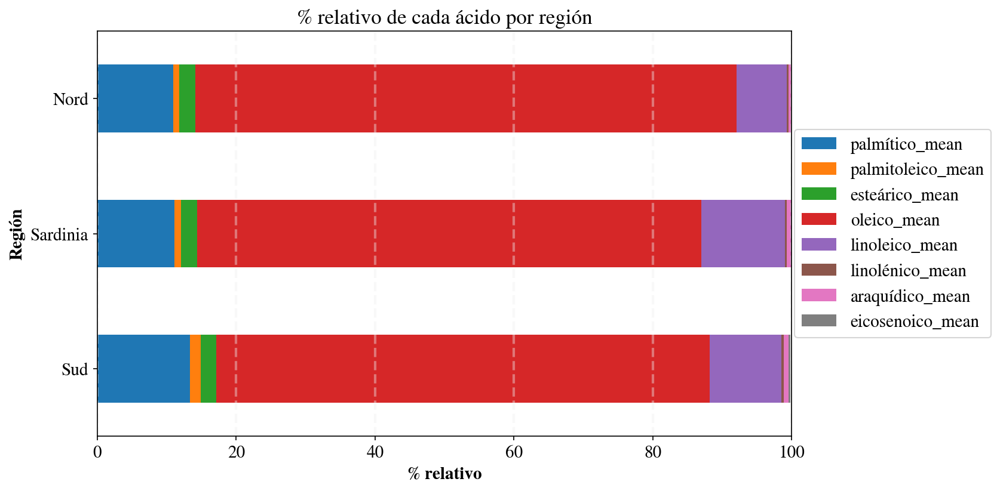

In [32]:
# Representamos la gráfica
ax = datos_percentage_mean.plot(kind='barh', stacked=True)

# Para sacar fuera de la gráfica la leyenda y facilitar la inspección
ax.legend(loc='right', bbox_to_anchor=(1.3, 0.5))
ax.set_xlim([0, 100])

# Añadimos estilo a la gráfica
ax.set_title("% relativo de cada ácido por región")
ax.set_xlabel("% relativo", weight='bold')
ax.set_ylabel("Región", weight='bold')
ax.set_yticklabels([dict_region[1], dict_region[2], dict_region[3]])

vals = ax.get_xticks()
for tick in vals:
    ax.axvline(x=tick, linestyle='dashed',
               alpha=0.4, color='#eeeeee', zorder=1)


**Comentario:**

Como se puede en esta gráfica, los porcentages relativos de cada ácido son relativamente similares para las tres regiones. El ácido oleico es el principal en las tres regiones, seguido por los ácidos palmítico y linoleico (aunque estos cuentan con un porcentage bastante menor que el oleico). Cabe destacar una mayor concenctración del ácido linoleico en la región Sardinia, que en las otras dos, sobre todo que en la región Nord.

Hemos representado las proporciones de ácidos grasos en cada región. Representaremos ahora para cada ácido graso, su distribución por regiones. Para ello, en primer lugar podemos dividir una figura en tantas subfiguras como ácidos grasos, mediante la función `subplots()`. Un lazo nos permitirá recorrer cada una de las subfiguras, y en cada una de ellas representaremos tres histogramas, cada uno de ellos representando el histograma del correspondiente ácido graso en una de las tres regiones.

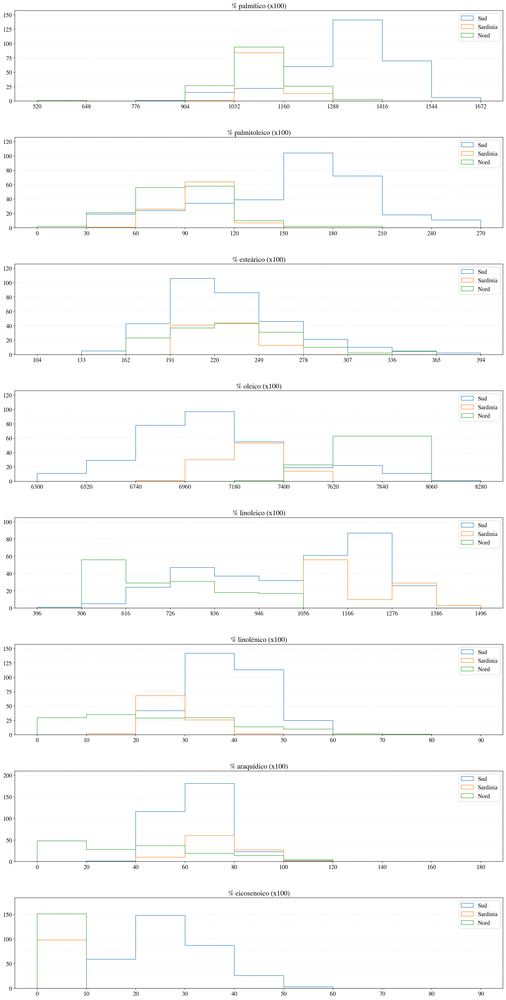

In [33]:
# Agrupamos por región
region = datos.groupby('región', as_index=True)

# Defino las subgráficas a utilizar
fig, axes = plt.subplots(figsize=(20, 40), nrows=len(acidos_names), ncols=1)

# Establecemos el espaciamiento entre cada plot
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

# Recorremos la lista de ácidos
for i, acido in enumerate(acidos_names):

    # Obtenemos el máximo y el mínimo, para representar los bins
    max_value = float('-inf')
    min_value = float('inf')

    for j in range(1, 4):
        max_aux = np.max(region.get_group(j).loc[:, acido])
        min_aux = np.min(region.get_group(j).loc[:, acido])

        # Redondeamos a la centena superior:
        max_aux = max_aux if max_aux % 100 == 0 else max_aux + 100 - max_aux % 100

        # Redondeamos a la centena inferior (minimo cero):
        min_aux = min_aux if min_aux % 100 == 0 else np.amax(
            [min_aux - 100 + min_aux % 100, 0])

        max_value = max_aux if max_aux > max_value else max_value
        min_value = min_aux if min_aux < min_value else min_value

    bins = np.arange(min_value, max_value, int((max_value - min_value) / 10))

    # Representamos la figura
    for j in range(1, 4):
        axes[i].hist(
            region.get_group(j).loc[:, acido],
            label=dict_region[j],
            bins=bins,
            histtype='step'
        )

    axes[i].set_xticks(bins)
    axes[i].set_xticklabels(bins)
    axes[i].legend(loc='upper right')

    # Etiquetamos correctamente
    axes[i].set_title(f'% {acido} (x100)')

    # Añadimos barras horizontales para cada porcentaje
    vals = axes[i].get_yticks()
    for tick in vals:
        axes[i].axhline(y=tick, linestyle='dashed',
                        alpha=0.4, color='#eeeeee', zorder=1)


Podemos calcular la frecuencia relativa acumulada del ácido graso eicosenoico respecto a un valor determinado (p.ej. 0.05) como la fracción de valores menores a 0.05 respecto al total. Para ello, podemos obtener la serie de condiciones a partir de la columna del ácido graso eicosenoico, lo que nos devolverá una serie de valores de verdad cierto o falso. Si luego sumamos mediante la función `np.sum()` los valores ciertos obtenemos el número total de valores menores que 0.05. Si aplicamos la función `np.mean()` obtenemos el valor deseado de la frecuencia relativa acumulada.

In [34]:
bajo = datos_percentage['eicosenoico'] < 0.05
total_valores = np.sum(bajo)
frecuencia_relativa_acumulada = np.mean(bajo)

print(
    f"Total de valores menores que 0.05: {total_valores}, de un total de {datos_percentage['eicosenoico'].size} valores"
)
print(f"Frecuencia relativa acumulada: {frecuencia_relativa_acumulada}")


Total de valores menores que 0.05: 249, de un total de 572 valores
Frecuencia relativa acumulada: 0.4353146853146853


Con pandas podemos indexar un objeto mediante una condición. Interpreta el siguiente código.

In [35]:
bajo = datos[datos_percentage['eicosenoico'] < 0.02]
print(pd.crosstab(bajo['área'], bajo['región'],
      margins=True, margins_name="Total"))


región   2   3  Total
área                 
5       19   0     19
6       11   0     11
7        0  17     17
8        0  11     11
9        0  14     14
Total   30  42     72


**Contestación:**

En el objeto `bajo` se almacenan en un nuevo DataFrame todas las muestras de aceite que tengan un valor relativo del ácido graso eicosenoico menor que 0,05. Después mediante la función `crosstab()`, ya vista anteriormente, lo que se hace es realizar una tabla de contingencia entre las etiquetas de regiones y las etiquetas de áreas, en la cuál se nos dice para cada combinación de los valores de estas columnas cuantos elementos hay en el DataFrame `bajo`. Como se puede ver, los valores para el ácido eicosenoico menores al 0,02% se encuentran en las regiones 2 y 3. Con más muestras en la región 3 (42 muestras) que en la 2 (30 muetras). De esta misma manera podemos ver que el área 7 es el área con más muestras del ácido eicosenoico menores que el 0,02%.

Hemos visto que el ácido oleico domina a los demás, lo que dificulta el análisis del resto de ácidos grasos. Eliminaremos el ácido oleico y representaremos los demás de nuevo mediante un diagrama de barras. ¿Qué podemos decir respecto al ácido eicosenoico?

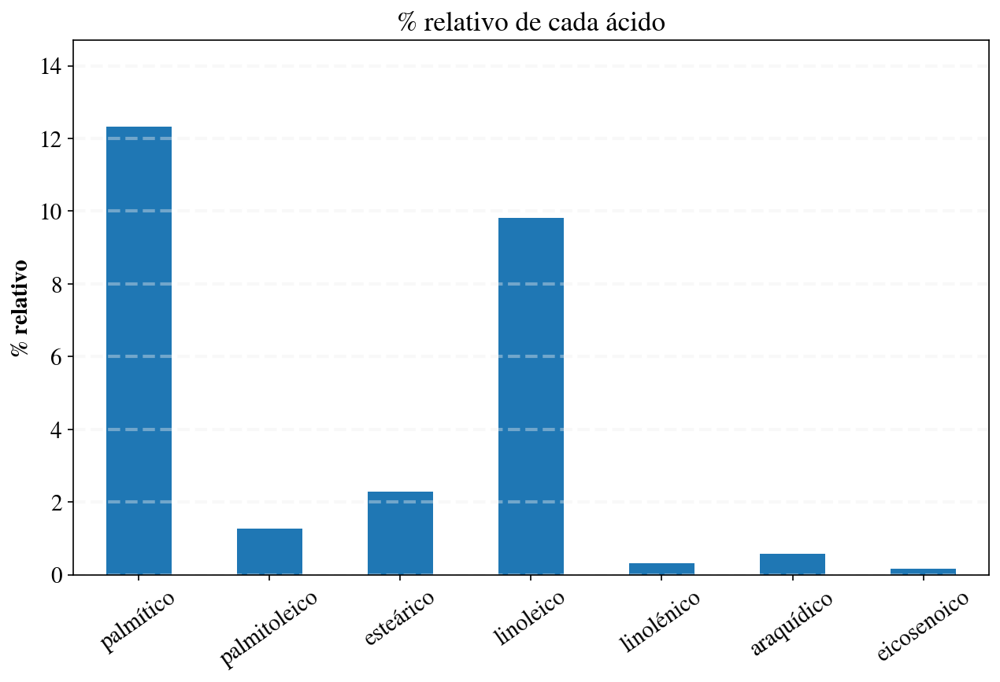

In [36]:
menosoleico = ['palmítico', 'palmitoleico', 'esteárico',
               'linoleico', 'linolénico', 'araquídico', 'eicosenoico']

# Calculo primero la información a representar
datos_mean_percentage = datos_percentage.loc[:, menosoleico].apply(np.mean)

# Representamos la gráfica de antes sin el ácido `oleico`
ax = datos_mean_percentage.plot(kind='bar', rot=35)

# Añadimos estilo a la gráfica
ax.set_title("% relativo de cada ácido")
ax.set_ylabel("% relativo", weight='bold')

# Añadimos barras horizontales para cada porcentaje
vals = ax.get_yticks()
for tick in vals:
    ax.axhline(y=tick, linestyle='dashed',
               alpha=0.4, color='#eeeeee', zorder=1)


**Contestación:**

Sobre el ácido eicosenoico podemos decir que es el ácido con una menor presencia en los aceites de las muestras de todo el conjunto de datos ya que su porcentage relativo es el más bajo de todos los ácidos con un valor menor al 0,5%.

Representa tres gráficos, uno por cada región, con los diagramas de cajas para cada uno de los ácidos grasos, menos el oleico. ¿Podemos decir algo respecto al ácido linoleico?

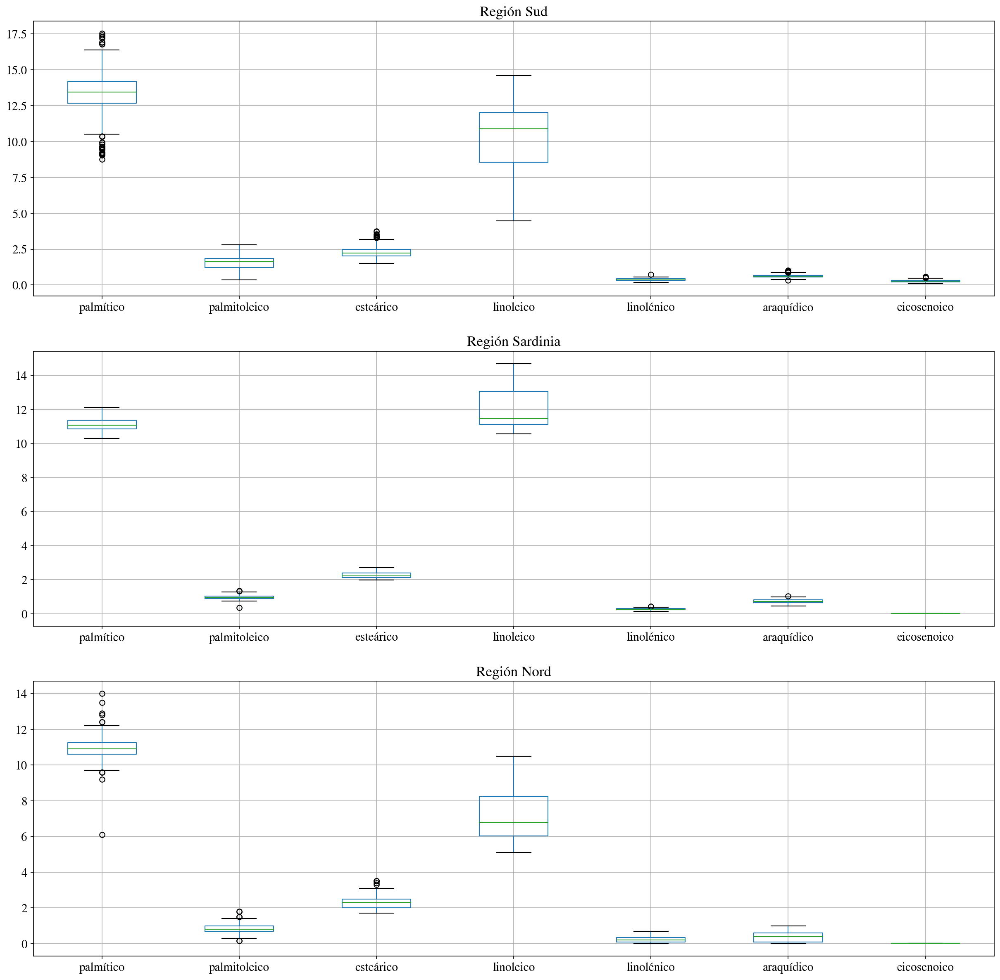

In [37]:
fig, axes = plt.subplots(figsize=(20, 20), nrows=3, ncols=1)

for clave, group in datos_percentage.groupby('región'):
    group.loc[:, menosoleico].boxplot(ax=axes[clave-1], grid=True)

    # Añadimos estilo a la gráfica
    axes[clave-1].set_title(f"Región {dict_region[clave]}")


**Contestación:**

Observando los diferentes *boxplots* para cada uno de los ácidos y cada una de las regiones observamos que en las tres regiones el *boxplot* para el ácido diferente es diferente al de los demás ácidos. 

El *boxplot*, o diagrama de cajas, es un método para representar gráficamente un conjunto de datos a través de sus cuartiles. De esta manera, se muestran a simple vista su mediana (la raya verde) y los cuartiles de sus datos (siendo el Q1 el límite inferior de la caja y su Q3 el límite superior de la caja), y también sus valores atípicos. De esta manera el diagrama de cajas nos permite estudiar la variabilidad de los datos.

Para el ácido linoleico podemos observar que para las tres regiones su rango intercuartil (diferencia entre Q3 y Q1) es la mayor de todas. Esto nos dice que es el ácido con una mayor variabilidad en su concentración en las muestras de aceite, es decir, que su valor aparece en un rango mayor de datos. Como se puede ver, para las tres regiones, su RIC (Rango Intercuartil) es aproximadamente igual a 2, por lo que podemos esperar que algunas muestras tengan incluso mñas de un 2% de esta cantidad de ácido más que otras muestras. Además, también podemos ver que no presenta valores atípicos, por lo que aunque su RIC sea más amplio no hay valores que destacan de forma atípica ni por arriba ni por abajo.

Representa un diagrama de coordenadas paralelas para los distintos ácidos grasos, mediante la función parallel_coordinates(). Puede ser útil normalizar los datos para que la media sea cero. Juega con distintos valores del parámetro alpha para poder distinguir mejor los distintos haces de valores.

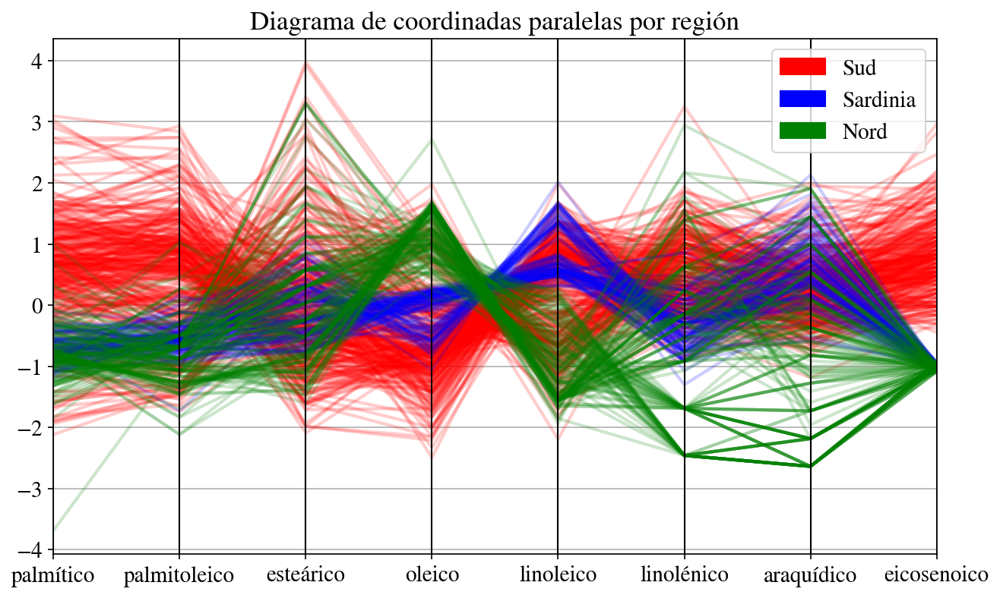

In [38]:
datos_acidos = datos_percentage.loc[:, acidos_names]

# Normalizamos los datos para que la media sea cero
datos_acidos_normalized = (datos_acidos - datos_acidos.apply(np.mean))/datos_acidos.apply(np.std)

# Añadimos la columna región original para poder representar
datos_acidos_normalized["región"] = datos["región"]

# Representamos el diagrama de coordenadas paralelas por región
ax = parallel_coordinates(
    datos_acidos_normalized, class_column="región", color=('red', 'blue', 'green'), alpha=0.2)
ax.set_title("Diagrama de coordinadas paralelas por región")

# Ponemos la leyenda
red_patch = mpatches.Patch(color='red', label=dict_region[1])
blue_patch = mpatches.Patch(color='blue', label=dict_region[2])
green_patch = mpatches.Patch(color='green', label=dict_region[3])
ax.legend(handles=[red_patch, blue_patch, green_patch], loc="upper right")


Representa un diagrama de dispersión del ácido linoleico frente al araquídico, diferenciando las tres regiones. Este gráfico es útil cuando queremos enfatizar un aspecto visual de los datos en una justificación. ¿Qué podemos decir respecto a la separabilidad de las distintas regiones? 

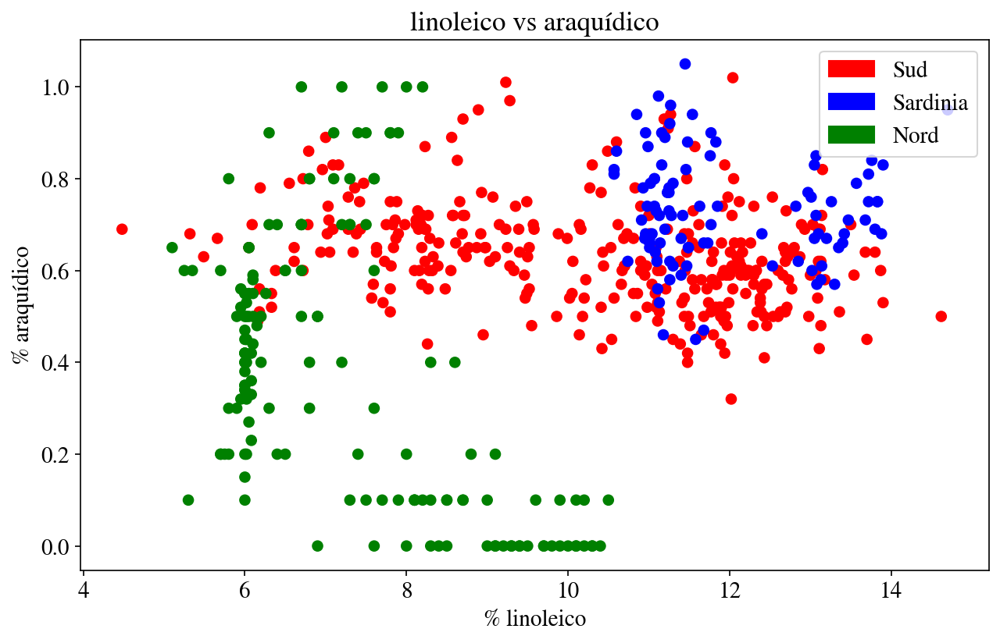

In [39]:
# Definimos la figura actual
fig = plt.figure()

# Definimos los ejes actuales
axis = fig.gca()

# Asignamos un color a cada region
colors = []
for region in datos_percentage['región']:
    if region == 1:
        colors.append('red')
    elif region == 2:
        colors.append('blue')
    else:
        colors.append('green')

# Representamos los datos mediante la función `scatter()`
axis.scatter(datos_percentage["linoleico"],
             datos_percentage["araquídico"], c=colors)

# Introducimos título de la figura y de los ejes a partir del objeto axis
axis.set_title('linoleico vs araquídico')
axis.set_xlabel(f'% linoleico')
axis.set_ylabel(f'% araquídico')

# Ponemos la leyenda
red_patch = mpatches.Patch(color='red', label=dict_region[1])
blue_patch = mpatches.Patch(color='blue', label=dict_region[2])
green_patch = mpatches.Patch(color='green', label=dict_region[3])
axis.legend(handles=[red_patch, blue_patch, green_patch], loc="upper right")


**Contestación:**

Respecto a la separabilidad de las distintas regiones podemos decir que estos dos ácidos en la región de Sardinia tienden a tomar valores mayores que en las otras regiones, es decir, las muestras de la región de Sardinia suelen contener un porcentaje mayor del ácido linoleico y del ácido araquídico que las otras dos regiones.

Por otra parte la región Nord es la que cuenta con los valores más bajos para el ácido araquídico de entre las tres regiones, teniendo por lo tanto el aceite de esta región una concentración menor de ácido araquídico que las demás regiones. Para el ácido linoleico, las muestras de la región Nord toman los valores bajos a intermedios, compartiendo este rango con la región Sud, sin embargo esta otra región tiene muestras con valores mayores que la región Nord no tiene.

Para la región Sud, podemos ver como sus valores para el ácido linoleico son muy variados mientras que para el ácido araquídico son relativamente altos. Para resumir, el ácido araquídico toma los valores más bajos en la región Nord mientras que el ácido linoleico también toma los valores más bajs en la región Nord; sus valores intermedios en las regiones Sud y Nord;  y sus valores más altos en las regiones Sud y Sardinia.

Representa mediante diagramas de dispersión los distintos ácidos grasos dos a dos. No es necesario permutar los parámetros en la representación. Indaga sobre la separabilidad observada.

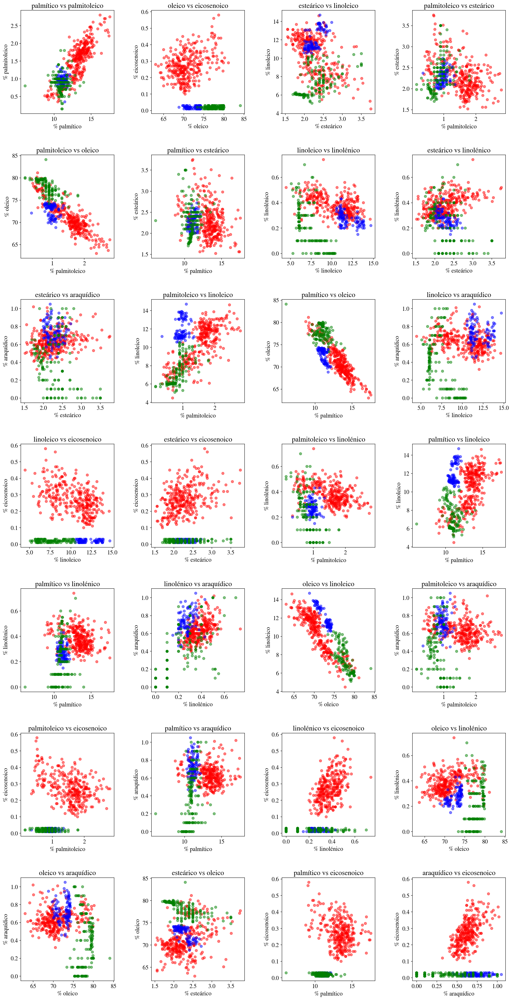

In [40]:
# Primero definimos los subplots
fig, axes = plt.subplots(figsize=(20, 40), nrows=len(
    acidos_names)-1, ncols=int(len(acidos_names)/2))

# Establecemos el espaciamiento entre cada plot
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

# Asignamos un color a cada region
colors = []
for region in datos_percentage['región']:
    if region == 1:
        colors.append('red')
    elif region == 2:
        colors.append('blue')
    else:
        colors.append('green')

# Utilizaremos dos bucles recorriendo la lista de acidos_x y acidos_y
i_aux = 0
j_aux = 0
for i, acido_x in enumerate(acidos_names):
    for j, acido_y in enumerate(acidos_names):
        if(i < j):
            # Representamos la figura
            axes[i_aux][j_aux].scatter(
                datos_percentage[acido_x], datos_percentage[acido_y], c=colors, alpha=0.5)

            # Etiquetamos correctamente
            axes[i_aux][j_aux].set_title(f'{acido_x} vs {acido_y}')
            axes[i_aux][j_aux].set_xlabel(f'% {acido_x}')
            axes[i_aux][j_aux].set_ylabel(f'% {acido_y}')

            i_aux = i_aux + 1 if i_aux < 6 else 0
            j_aux = j_aux + 1 if j_aux < 3 else 0


**Contestación:**

Observando lso diagramas de dispersión de los distintos ácidos dos a dos podemos sacar algunas conclusiones generales sobre la separabilidad de las distintas regiones. En primer lugar, se puede observar como la región de Sardinia cuanta con el menor número de muestras.

Por otra parte, en casi todos los diagramas la región que más se diferencia de las otras dos es la región Sud. En algunos casos tiene valores mayores para algunos de los ácidos y en otros casos toma valores menores, pero en general suele ser la que más separabilidad presenta. De esta manera podemos llegar a la conclusión de que los aceites de esta región son los más reconocibles para el consumidor y los más fácilis de distinguir por su sabor.

Además, también podemos observar como los aceites de la región Nord son los que más variabilidad presentan entra las distintas muestras de aceite. Esto nos puede hacer pensar que son los aceites con un sabor más inconsistente, es decir, que diferentes botellas de aceites de esta región se diferencian más entre ellas que botellas de aceite de las otras regiones.

En este caso estamos comparando dos a dos, es decir, reduciendo a dos dimensiones los gráficos. Teniendo en cuenta todas las dimensiones sería interesante estudiar si se puede, mediante algún tipo de clustering, obtener la región a la que pertenece una muestra de aceite a partir de los valores en porcentage para los distintos ácidos.

## 3. Análisis por áreas

Hasta aquí hemos realizado un análisis de los distintos aceites según su región de procedencia. **Podríamos extender el trabajo a las distintas áreas de procedencia, analizando igualmente la separabilidad. ¿Qué podríamos concluir?**

En primer lugar, trataremos, al igual que para as regiones si podemos extraer información útil de la separabilidad entre las distintas áreas a partir de un diagrama de dispersión de los distintos gráficos dos a dos. Para cada combinación de los distintos ácidos nos quedará una gráfica como la que se muestra a continuación, que es un ejemplo con los ácidos linoleico y araquídico:

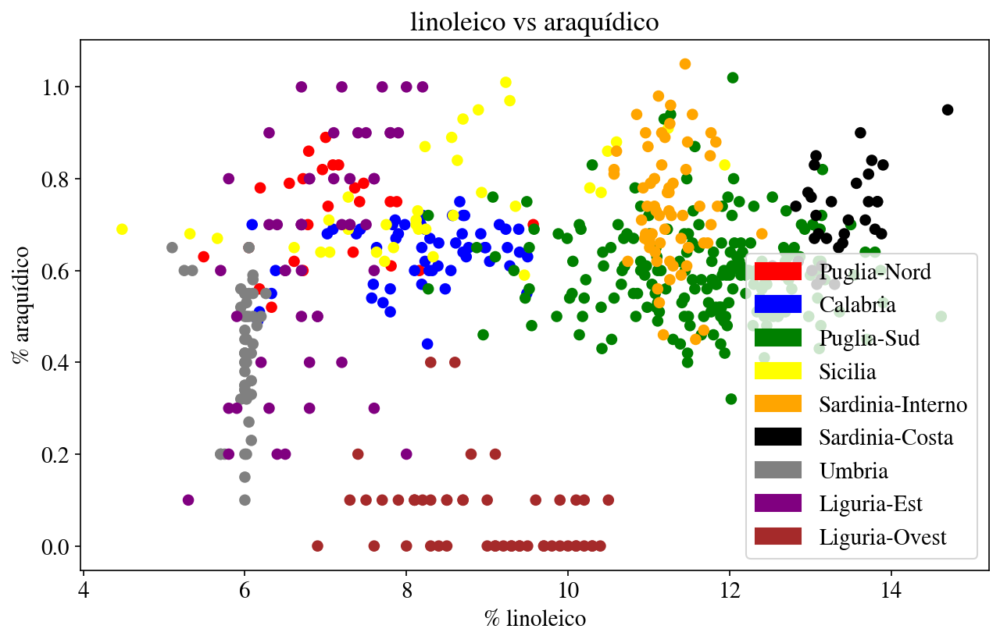

In [41]:
# Añadimos la columna de procedencia
datos_percentage["procedencia"] = datos["procedencia"]

# Definimos la figura actual
fig = plt.figure()

# Definimos los ejes actuales
axis = fig.gca()

# Introducimos título de la figura y de los ejes a partir del objeto axis
axis.set_title('linoleico vs araquídico')
axis.set_xlabel(f'% linoleico')
axis.set_ylabel(f'% araquídico')

# Asignamos un color a cada procedencia
colors = []
for procedencia in datos_percentage['procedencia']:
    if procedencia == 'Puglia-Nord':
        colors.append('red')
    elif procedencia == 'Calabria':
        colors.append('blue')
    elif procedencia == 'Puglia-Sud':
        colors.append('green')
    elif procedencia == 'Sicilia':
        colors.append('yellow')
    elif procedencia == 'Sardinia-Interno':
        colors.append('orange')
    elif procedencia == 'Sardinia-Costa':
        colors.append('black')
    elif procedencia == 'Umbria':
        colors.append('gray')
    elif procedencia == 'Liguria-Est':
        colors.append('purple')
    elif procedencia == 'Liguria-Ovest':
        colors.append('brown')

# Representamos los datos mediante la función `scatter()`
axis.scatter(datos_percentage["linoleico"],
             datos_percentage["araquídico"], c=colors)

# Ponemos la leyenda
handles = []
handles.append(mpatches.Patch(color='red', label='Puglia-Nord'))
handles.append(mpatches.Patch(color='blue', label='Calabria'))
handles.append(mpatches.Patch(color='green', label='Puglia-Sud'))
handles.append(mpatches.Patch(color='yellow', label='Sicilia'))
handles.append(mpatches.Patch(color='orange', label='Sardinia-Interno'))
handles.append(mpatches.Patch(color='black', label='Sardinia-Costa'))
handles.append(mpatches.Patch(color='gray', label='Umbria'))
handles.append(mpatches.Patch(color='purple', label='Liguria-Est'))
handles.append(mpatches.Patch(color='brown', label='Liguria-Ovest'))
axis.legend(handles=handles, loc="lower right")


Como se puede ver, con un número más elevado de áreas que de regiones se vuelve más complicado sacar conclusiones sobre la separabilidad de las distintas áreas, aunque aún se puede extraer algo de información de estas gráficas. Como se puede ver, los valores más altos tanto para el ácido linoleico como para el ácido araquídico se dan en el área de Sardinia-Costa. Por otra parte, los valores más bajos para el ácido araquídico se dan en el área de Liguria-Ovest.

Por lo tanto, representamos estos gráficos de dispersión para todos los ácidos dos a dos. Cabe dejar claro que dado que la gráfica para el ácido1 vs el ácido2 contiene la misma información que la del ácido2 vs ácido1 pero con los ejes intercambiados, solo representaremos una de estas dos combinaciones de cada par de ácidos, con el fin de que no haya información redundante. Por lo tanto estas gráficas toman la siguiente forma:

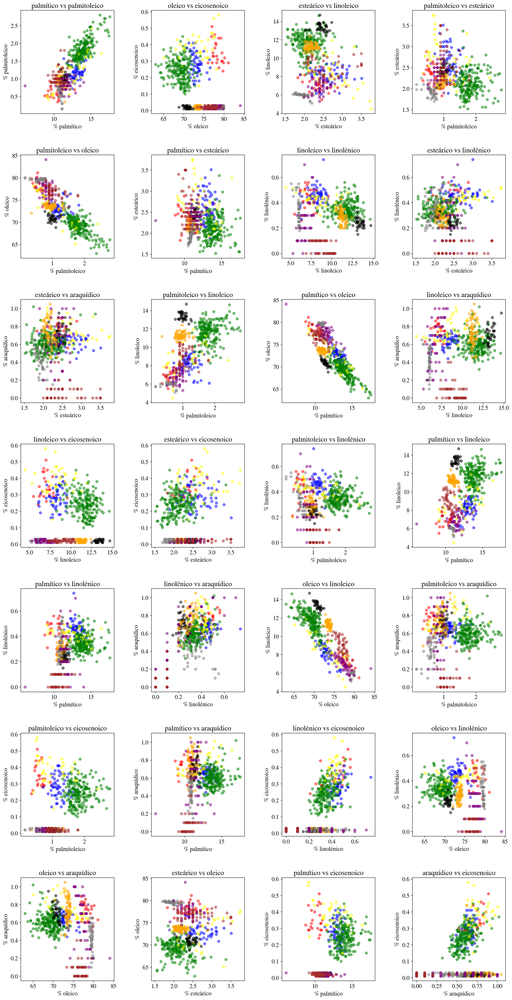

In [42]:
# Primero definimos los subplots
fig, axes = plt.subplots(figsize=(20, 40), nrows=len(
    acidos_names)-1, ncols=int(len(acidos_names)/2))

# Establecemos el espaciamiento entre cada plot
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

# Asignamos un color a cada procedencia
colors = []
for procedencia in datos_percentage['procedencia']:
    if procedencia == 'Puglia-Nord':
        colors.append('red')
    elif procedencia == 'Calabria':
        colors.append('blue')
    elif procedencia == 'Puglia-Sud':
        colors.append('green')
    elif procedencia == 'Sicilia':
        colors.append('yellow')
    elif procedencia == 'Sardinia-Interno':
        colors.append('orange')
    elif procedencia == 'Sardinia-Costa':
        colors.append('black')
    elif procedencia == 'Umbria':
        colors.append('gray')
    elif procedencia == 'Liguria-Est':
        colors.append('purple')
    elif procedencia == 'Liguria-Ovest':
        colors.append('brown')
    
# Utilizaremos dos bucles recorriendo la lista de acidos_x y acidos_y
i_aux = 0
j_aux = 0
for i, acido_x in enumerate(acidos_names):
    for j, acido_y in enumerate(acidos_names):
        if(i < j):
            # Representamos la figura
            axes[i_aux][j_aux].scatter(
                datos_percentage[acido_x], datos_percentage[acido_y], c=colors, alpha=0.5)

            # Etiquetamos correctamente
            axes[i_aux][j_aux].set_title(f'{acido_x} vs {acido_y}')
            axes[i_aux][j_aux].set_xlabel(f'% {acido_x}')
            axes[i_aux][j_aux].set_ylabel(f'% {acido_y}')

            i_aux = i_aux + 1 if i_aux < 6 else 0
            j_aux = j_aux + 1 if j_aux < 3 else 0

Se puede ver como una de las áreas que más se diferencia de las otras en sus valores es el área de Publia-Sud (en verde). Esto tiene sentido ya que en el ánalisis por regiones llegamos a la conclusión de que una de las regiones llegamos a la conclusión de que la región Sud era la que más se diferenciaba de las demás, y como el área de Puglia-Sud está en la región Sud y también muestra una gran separabilidad se podría decir que la separabilidad de la región Sud se debe en gran parte a la presencia de los aceites del área de Puglia-Sud.

Por otro lado, analizando el ácido eicosenoico podemos ver como son 4 áreas las que concentran un mayor porcentage de este ácido en sus aceites, mientras que las otras áreas prácticamente no tienen ninguna cantidad de este ácido. Estas áreas son las de Puglia-Nord, Calabria, Puglia-Sud y Sicilia. También se puede ver como el área de Liguria-Ovest presenta los valores más bajos para la mayoría de ácidos, mientras que cuenta con un valor muy alto para el ácido oleico, por lo que los aceites de esta área presenta poca variadad en los ácidos que contienen.

Ahora, a partir de la media de los valores de cada ácido por área representaremos un **diagrama de tela de araña** para cada una de las áreas, para ver que áreas presentan mayor cantidad de un ácido respecto a los demás de una manera más clara. Empezamos por preparar los datos que queremos representar:

In [43]:
# Definimos la lista de columnas que queremos utilizar
columns = ["procedencia", "palmítico", "palmitoleico", "esteárico",
                "oleico", "linoleico", "linolénico", "araquídico", "eicosenoico"]

# Agrupamos por área
area = datos_percentage.loc[:, columns].groupby('procedencia')

# Calculamos la media para cada región
area_mean = area.apply(np.mean)


Ahora ya podemos representar en un diagrama de tela de araña. Como probablemente el ácido oleico impida la visualización correcta del resto de ácidos primero probamos a ver el resultado de una de las gráficas teniendo en cuenta todos los ácidos. Para este ejemplo representaremos la gráfica del área de Calabria:

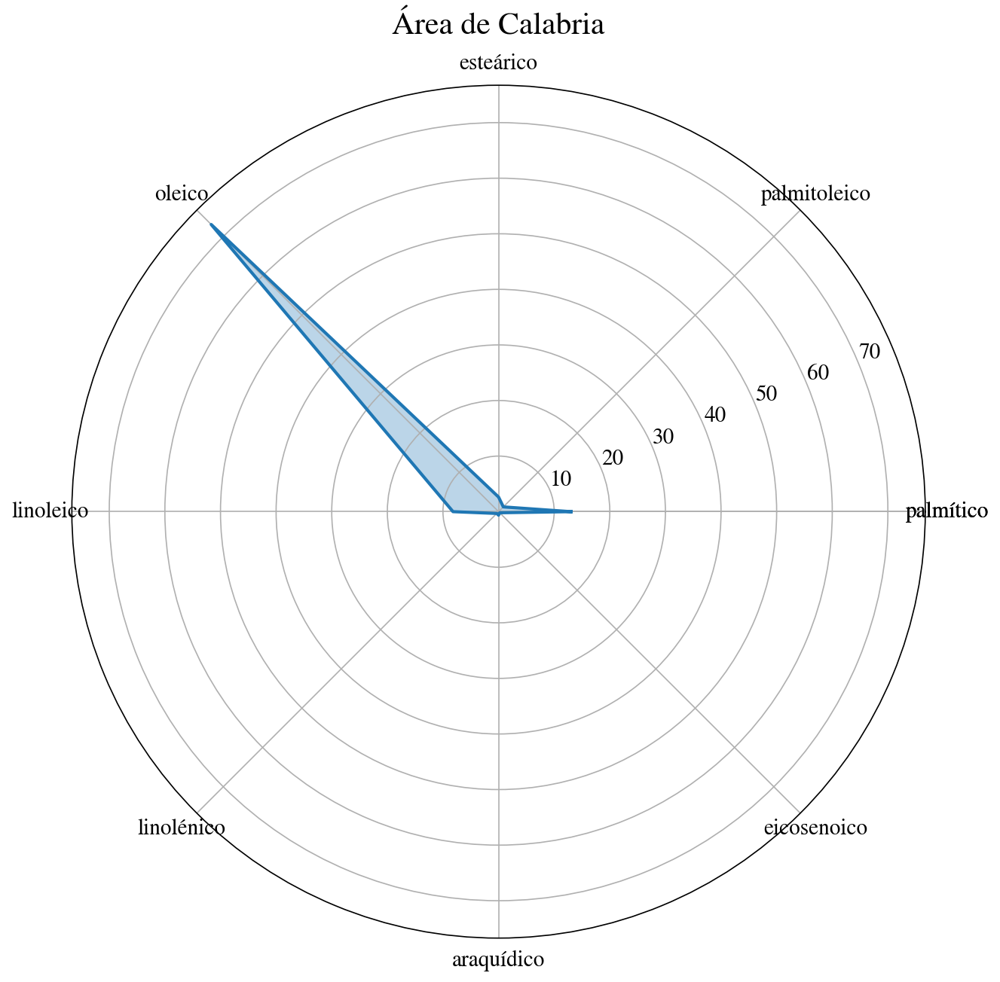

In [44]:
# Se obtienen las categorías y los valores para el área de Calabria
categories = area_mean.columns
categories = [*categories, categories[0]]
acido = area_mean.loc['Calabria', :]
acido = [*acido, acido[0]]

# Se calcula la localización de las etiquetas
label_loc = np.linspace(start=0, stop=2 * np.pi, num=len(acido))

# Se plotea
plt.figure(figsize=(10, 10))
plt.subplot(polar=True)
plt.plot(label_loc, acido)
plt.fill_between(label_loc, acido, alpha=0.3)
plt.title('Área de Calabria', size=20, y=1.05)
lines, labels = plt.thetagrids(np.degrees(label_loc), labels=categories)


Como se puede observar, el ácido oleico hace que distinguir los matices para los demás ácidos sea casi imposible, por lo que no lo representaremos. Esta misma gráfica sin tener en cuenta el ácido oleico toma la siguiente forma:

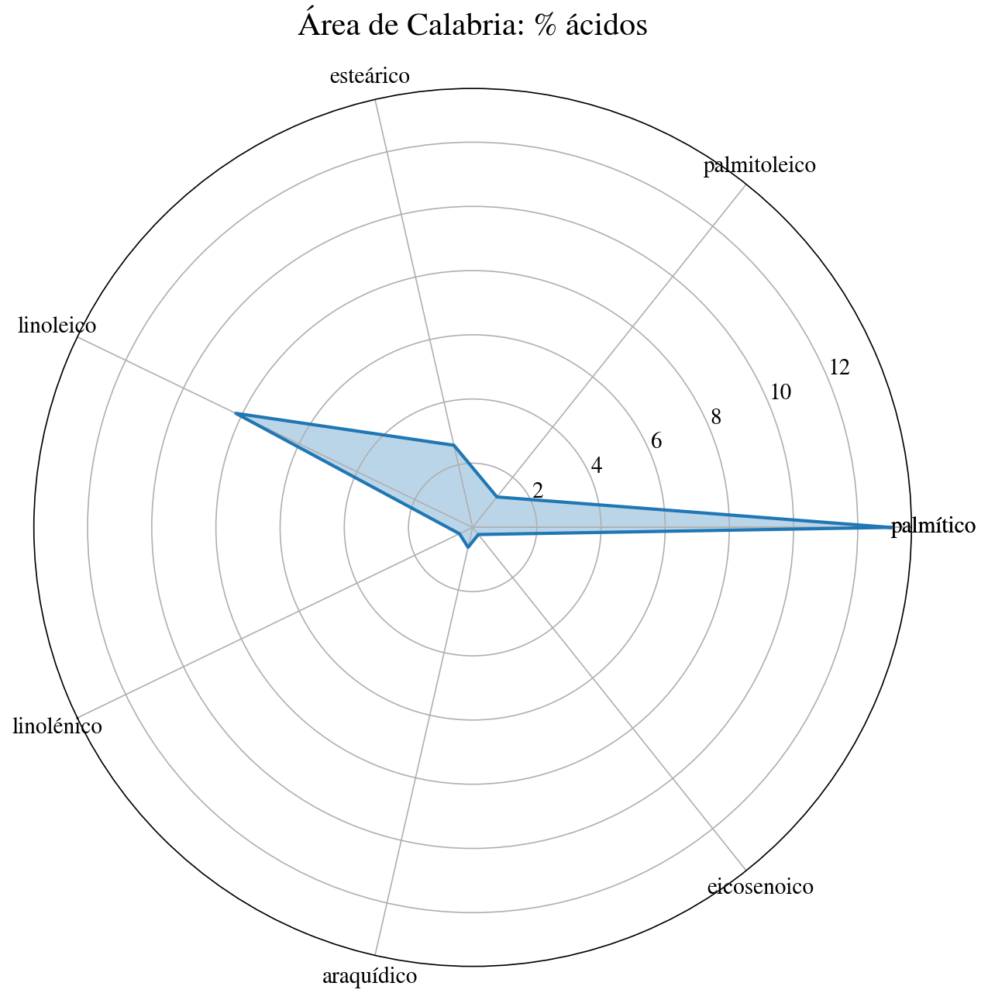

In [45]:
# Definimos la lista de columnas que queremos utilizar
columns = ["palmítico", "palmitoleico", "esteárico", "linoleico", "linolénico", "araquídico", "eicosenoico"]

# Descartamos la columna del ácido oleico
area_mean_sin_oleico = area_mean.loc[:, columns]

categories = area_mean_sin_oleico.columns
categories = [*categories, categories[0]]
acido = area_mean_sin_oleico.loc['Calabria', :]
acido = [*acido, acido[0]]

label_loc = np.linspace(start=0, stop=2 * np.pi, num=len(acido))

plt.figure(figsize=(10, 10))
plt.subplot(polar=True)
plt.plot(label_loc, acido)
plt.fill_between(label_loc, acido, alpha=0.3)
plt.title('Área de Calabria: % ácidos', size=20, y=1.05)
lines, labels = plt.thetagrids(np.degrees(label_loc), labels=categories)
plt.show()

Ahora ya se puede distinguir un poco mejor la presencia de cada uno de los ácidos por áreas. Por lo tanto representaremos el diagrama en tela de araña para cada área, en una matriz de 3x3 gráficas:

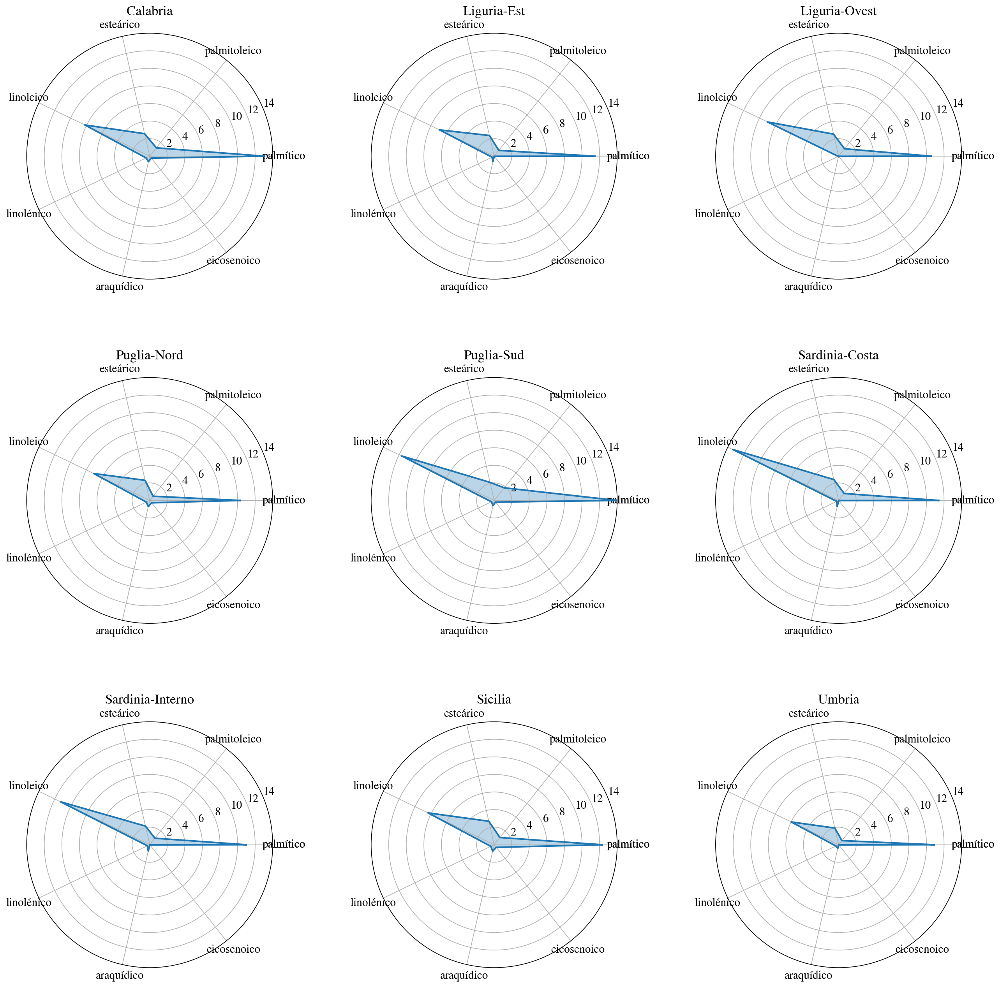

In [46]:
fig, axes = plt.subplots(figsize=(20, 20), nrows=3, ncols=3, subplot_kw=dict(projection="polar"))

# Establecemos el espaciamiento entre cada plot
plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.4)

categories = area_mean_sin_oleico.columns
categories = [*categories, categories[0]]

label_loc = np.linspace(start=0, stop=2 * np.pi, num=len(categories))

i = 0
j = 0
for index in area_mean_sin_oleico.index:
    acido = area_mean_sin_oleico.loc[index, :]
    acido = [*acido, acido[0]]

    axes[i][j].plot(label_loc, acido)
    axes[i][j].fill_between(label_loc, acido, alpha=0.3)
    axes[i][j].set_title(f'{index}')
    axes[i][j].set_ylim(0, 14)
    axes[i][j].grid(True)
    lines, labels = axes[i][j].set_thetagrids(np.degrees(label_loc), labels=categories)

    j = j + 1 if j < 2 else 0
    i = i + 1 if j == 0 else i


Ahora podemos ver de una mejor manera la presencia, en porcentages, de cada uno de los ácidos en cada una de las regiones. Al estar todas las gráficas en tela de araña en la misma escala (del 0% al 14%) podemos comparar las distintas áreas entre sí. De esta manera vemos como el ácido palmítico es el que tiene una mayor presencia de entre todos los ácidos en todas las áreas, dándose los porcentages más altos para este ácido en el área de Puglia-Sud.

Por otra parte, los porcentages para los ácidos linolénico, araquídico, eicosenoico y palmitoleico son muy bajos en todas las áreas, por lo que no nos permiten establecer ninguna separabilidad entre las distintas áreas. Sin embargo, el ácido linoleico sí que presenta variaciones por áreas, tomando el valor medio más alto para el área de Sardinia-Costa y el más bajo para el área de Umbria, de esta manera estas dos áreas se pueden separar del resto.